## Packages

In [1]:
import numpy as np                                # scientific computing toolkit
import pandas as pd                               # data analysis toolkit
import scanpy as sc                               # scanpy is referred to with sc.***
import matplotlib.pyplot as plt                   # Matplotlib is referred to with plt.***
from scipy import stats                           # for linear regressions
import seaborn as sns                             # for easy heatmaps
import scirpy as ir                               # TCR analysis
import scvelo as scv
#import mudata as md                               # New data structure 
#from mudata import MuData

sc.settings.verbosity = 3                         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()                         # check if all needed versions are installed and up to date (old: print_Versions(), changed in new version of scanpy)
results_directory = './Analysis_output/'
results_file = results_directory + '/results_file/write/results.h5ad'             # the file that will store the analysis results

## Directory variables

In [2]:
import glob
import os
from pathlib import Path

sample_directory = './GEX_VDJ/'
analysis_info = './analysis_info/'
adata_directory = './analysis_output/IMMUN_COM/annotated_files/'

In [3]:
plt.rcParams['figure.figsize']=(6,6) #rescale figures
#sc.set_figure_params(dpi=100, dpi_save=400, color_map='viridis', vector_friendly=True, format='eps', ipython_format = 'png2x')
### you can set a default figure directory here for saving output
sc.settings.figdir = "./analysis_output/IMMUN_COM/"
## Figure directory for matplotlib figures/axes
save_figure_sc = "./analysis_output/IMMUN_COM/"
#Use
#plt.savefig(save_figure + 'image.pdf')
save_figure_ir = "./analysis_output/IMMUN_COM/"
#csv directory
read_csv = './analysis_output/IMMUN_COM/'
save_csv = r'./analysis_output/IMMUN_COM/'

## Load data

In [4]:
# define sample metadata. Usually read from a file.
samples = {
    "1_dp_mult": {"group": "mouse_1_20_dp_mult_unstim"},
    "2_dp_mult": {"group": "mouse_21_40_dp_mult_unstim"},
    "3_dp_mult": {"group": "mouse_41_60_dp_mult_unstim"},
    "4_dp_mult": {"group": "mouse_61_80_dp_mult_unstim"},
}

In [5]:
# Create a list of AnnData objects (one for each sample)
adatas = []
for sample, sample_meta in samples.items():
    gex_file = glob.glob(f'{sample_directory}/GEX/dp_mult/*{sample}*/outs/filtered_feature_bc_matrix/')[0]
    tcr_file = glob.glob(f'{sample_directory}/VDJ/dp_mult/*{sample}*/outs/*annotations.json')[0]
    adata = sc.read_10x_mtx(gex_file,
                            var_names='gene_symbols',      # use gene symbols for the variable names (variables-axis index)
                            cache=True, gex_only=False)   # write a cache file for faster subsequent reading
    adata_tcr = ir.io.read_10x_vdj(tcr_file)
    change_cat = adata_tcr.obs.columns.tolist()           #NaN values in VDJ data can mess up analysis for some reason
    for i in change_cat:                                   #here all NaN (basically for TCR chain calls) are replaced by 'None'
        adata_tcr.obs[i]=adata_tcr.obs[i].astype(str)
        adata_tcr.obs[i]=adata_tcr.obs[i].fillna('None')
        adata_tcr.obs[i]=adata_tcr.obs[i].replace('nan' ,'None')
        adata_tcr.obs[i]=adata_tcr.obs[i].astype('category')
    ir.pp.merge_with_ir(adata, adata_tcr)
    adata.obs["experiment"] = sample
    adata.obs["group"] = sample_meta["group"]
    # concatenation only works with unique gene names
    adata.var_names_make_unique()
    adatas.append(adata)

... reading from cache file cache\GEX_VDJ-GEX-dp_mult-1_dp_mult_GEX_1-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\GEX_VDJ-GEX-dp_mult-2_dp_mult_GEX_2-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\GEX_VDJ-GEX-dp_mult-3_dp_mult_GEX_3-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\GEX_VDJ-GEX-dp_mult-4_dp_mult_GEX_4-outs-filtered_feature_bc_matrix-matrix.h5ad


# Preprocessing

## Hashtag Antibodies

Highest expressed genes in all samples and quality check for hashtag antibody expression - Show those genes that yield the highest fraction of counts in each single cells, across all cells.

normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


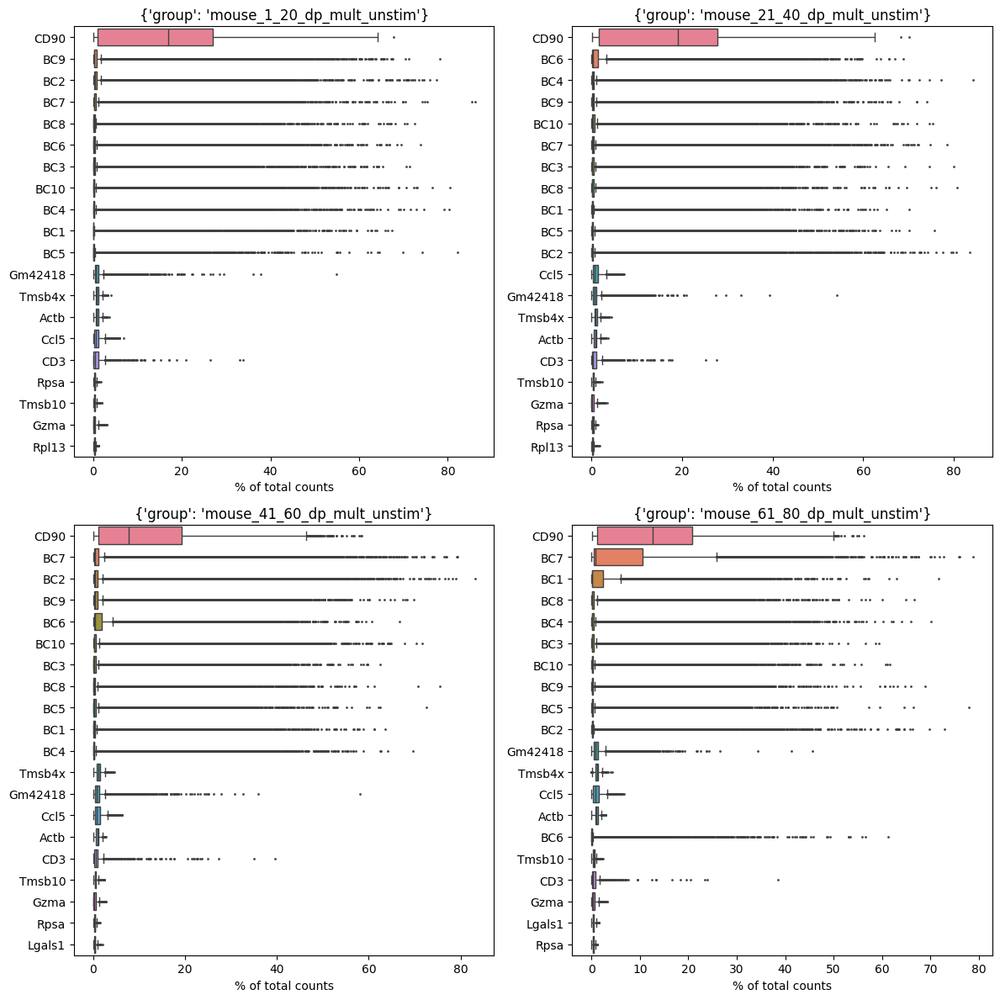

In [6]:
nrows = len(adatas)//2
ncols = 2
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12,3*len(adatas)))
index = 0
axis = 0

for i, adata in enumerate(adatas):
    if index <ncols:
        sc.pl.highest_expr_genes(adata, n_top=20, ax=ax[axis,index], show=False)
        ax[axis,index].set_title(samples[adata.obs.experiment[0]])
        index = index + 1
    else:
        axis = axis + 1
        sc.pl.highest_expr_genes(adata, n_top=20, ax=ax[axis,0], show=False)
        ax[axis,0].set_title(samples[adata.obs.experiment[0]])
        index = 1
fig.tight_layout()
plt.show() 

fig.savefig(save_figure_sc + 'highest_expr_genes_dp_mult.pdf')

### Basic filter

In the next step we will apply some bacic filters to these cells. Therefore we can control for the minimum number of genes per cell, to take this cell into account. A second filter will filter out genes, which are present in less than a certain number of cells.

In [7]:
for i, adata in enumerate(adatas):
    print(adatas[i].obs.experiment[0] + ' :Total number of cells: {:d}'.format(adatas[i].n_obs))
    sc.pp.filter_cells(adatas[i], min_genes=200)
    sc.pp.filter_genes(adata[i], min_cells=3)
    print(adatas[i].obs.experiment[0] +': Total number of cells after filtering: {:d}'.format(adatas[i].n_obs))

1_dp_mult :Total number of cells: 15768
filtered out 12 cells that have less than 200 genes expressed
filtered out 32297 genes that are detected in less than 3 cells
1_dp_mult: Total number of cells after filtering: 15756
2_dp_mult :Total number of cells: 24934
filtered out 13 cells that have less than 200 genes expressed
filtered out 32297 genes that are detected in less than 3 cells
2_dp_mult: Total number of cells after filtering: 24921
3_dp_mult :Total number of cells: 27965
filtered out 20 cells that have less than 200 genes expressed
filtered out 32297 genes that are detected in less than 3 cells
3_dp_mult: Total number of cells after filtering: 27945
4_dp_mult :Total number of cells: 19428
filtered out 14 cells that have less than 200 genes expressed
filtered out 32297 genes that are detected in less than 3 cells
4_dp_mult: Total number of cells after filtering: 19414


## Annotation of data

In [8]:
bc_group = ['CD3', 'CD90']
bc_m = ['BC1','BC2','BC3','BC4','BC5','BC6','BC7','BC8','BC9','BC10']
bc_all = bc_group + bc_m
bc_m_HTO = []
for i in bc_m:
    bc_m_HTO.append(i + '_HTO')

In [9]:
adatas_HTO = [0]*len(adatas)
for i, adata in enumerate(adatas):
    adatas_HTO[i]=adata[:, adata.var_names.isin(bc_all)]

## HashSolo

Normalize Barcode expression for plotting after running HashSolo

In [10]:
def clr_normalize_each_cell(adata, inplace=True):
    """Normalize count vector for each cell, i.e. for each row of .X"""

    import numpy as np
    import scipy

    def seurat_clr(x):
        # TODO: support sparseness
        s = np.sum(np.log1p(x[x > 0]))
        exp = np.exp(s / len(x))
        return np.log1p(x / exp)

    if not inplace:
        adata = adata.copy()

    # apply to dense or sparse matrix, along axis. returns dense matrix
    adata.X = np.apply_along_axis(
        seurat_clr, 1, (adata.X.toarray() if scipy.sparse.issparse(adata.X) else adata.X)
    )
    return adata

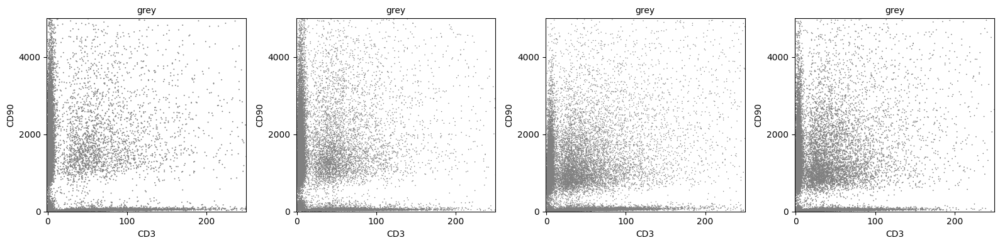

In [11]:
fig, ax = plt.subplots(ncols=4, figsize=(16,4))
for i, adata in enumerate(adatas_HTO):
    #clr_normalize_each_cell(adata)
    scv.pl.scatter(adata, x='CD3', y='CD90', show = False, ax = ax[i],xlim = [-1,250], ylim= [-1,5000])
fig.tight_layout()
plt.show()   

Remove doublets

In [12]:
cutoff_list_cd3 = [15,15,15,10]

In [13]:
for i, adata in enumerate(adatas_HTO):
    cd90 = (adata[: , 'CD90'].X>300).todense()
    cd3 = (adata[: , 'CD3'].X>cutoff_list_cd3[i]).todense()
    
    df = pd.DataFrame(cd3, columns=['CD3'])
    df['CD90'] = cd90
    
    adatas_HTO[i] = adata[df.sum(axis=1)<2].copy()

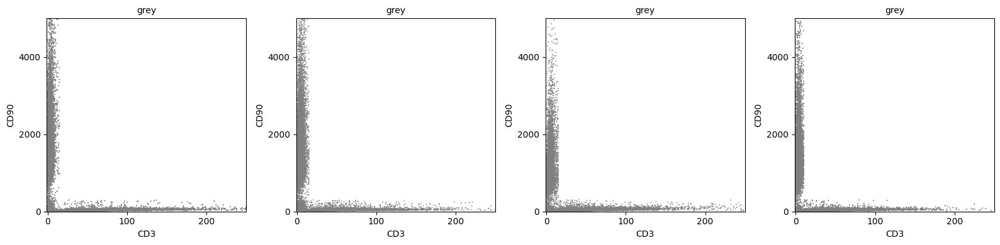

In [14]:
fig, ax = plt.subplots(ncols=4, figsize=(16,4))
for i, adata in enumerate(adatas_HTO):
    scv.pl.scatter(adata, x='CD3', y='CD90', show = False, ax = ax[i], xlim = [-1,250], ylim= [-1,5000])
fig.tight_layout()
plt.show()

Annotate samples by barcode

In [15]:
for i, adata in enumerate(adatas_HTO):
    adatas_HTO[i].obs['group_bc'] = 'None'
#Define cutoffs for Barcode expression    
    cd90 = (adata[: , 'CD90'].X>400).todense()
    cd3 = (adata[: , 'CD3'].X>18).todense()
#make Dataframe from adata.X CD3 and CD90    
    df = pd.DataFrame(cd3, columns=['cd3'])
    df['cd90'] = cd90
#Rename values in Dataframe
    df.cd3[df.cd3==True]='CD3'
    df.cd3[df.cd3==False]='None'
    df.cd90[df.cd90==True]='CD90'
    df.cd90[df.cd90==False]='None'
    
#Combine CD3 and CD90 column into one column
    df['bc'] = df.cd3 + df.cd90

#Rename combined column so it makes sense
    df.bc[df.bc=='NoneCD90'] = 'CD90'
    df.bc[df.bc=='CD3None'] = 'CD3'
    df.bc[df.bc=='NoneNone'] = 'None'
    
    bc_list = df.bc.tolist()
#Annotate adatas    
    adatas_HTO[i].obs.group_bc=bc_list

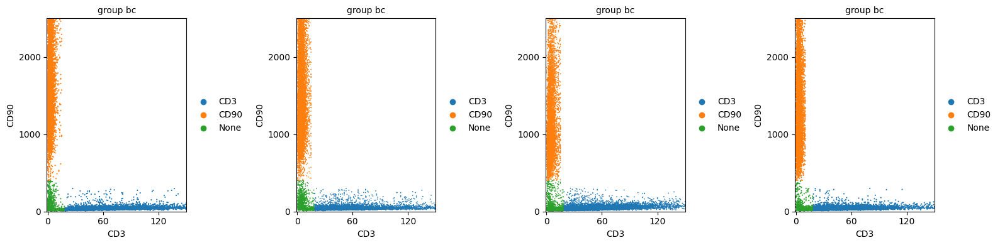

In [16]:
fig, ax = plt.subplots(ncols=4, figsize=(16,4))
for i, adata in enumerate(adatas_HTO):
    scv.pl.scatter(adata, x='CD3', y='CD90', color='group_bc', legend_loc='right_margin', show = False, ax = ax[i], xlim = [-1,150], ylim= [-1,2500])
fig.tight_layout()
plt.show()

In [17]:
for i, adata in enumerate(adatas_HTO):
    adatas_HTO[i] = adata[:, adata.var_names.isin(bc_m)].copy()

Run rest of HashSolo

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
computing PCA
    with n_comps=9
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:06)
running Leiden clustering
    finished: found 11 clusters and added
    'HTO_leiden', the cluster labels (adata.obs, categorical) (0:00:02)
computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:36)


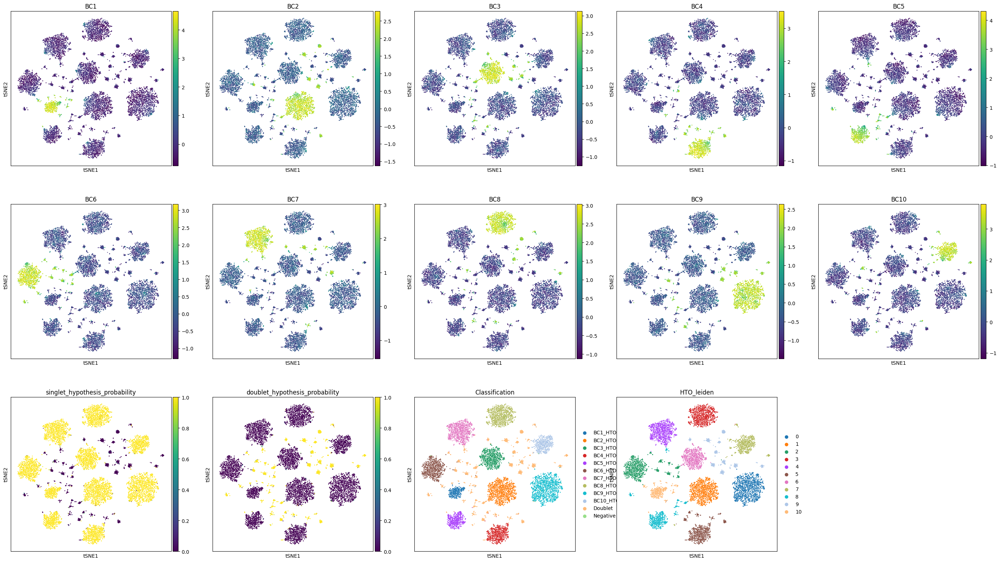

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
computing PCA
    with n_comps=9
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
running Leiden clustering
    finished: found 12 clusters and added
    'HTO_leiden', the cluster labels (adata.obs, categorical) (0:00:04)
computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:59)


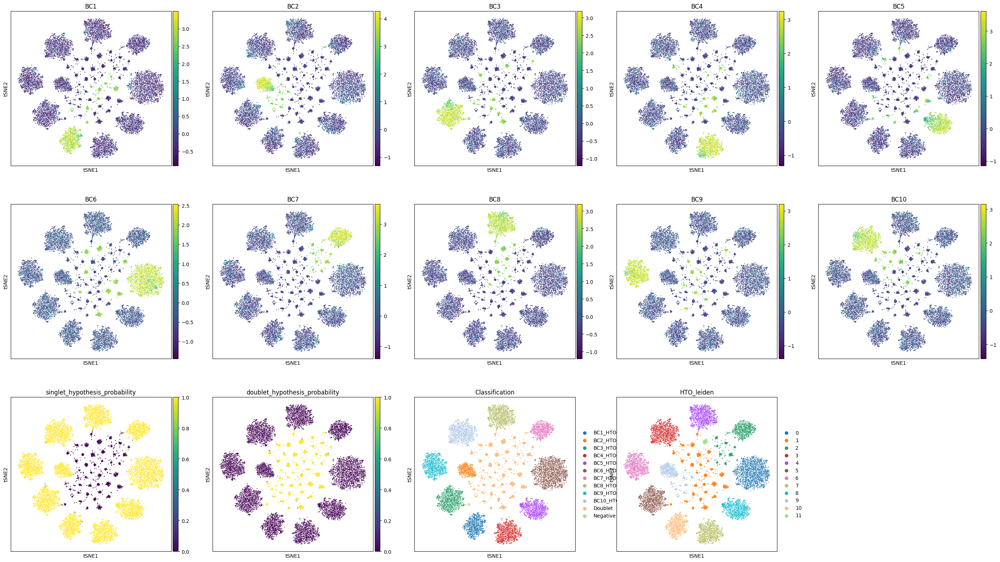

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
computing PCA
    with n_comps=9
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
running Leiden clustering
    finished: found 13 clusters and added
    'HTO_leiden', the cluster labels (adata.obs, categorical) (0:00:03)
computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:48)


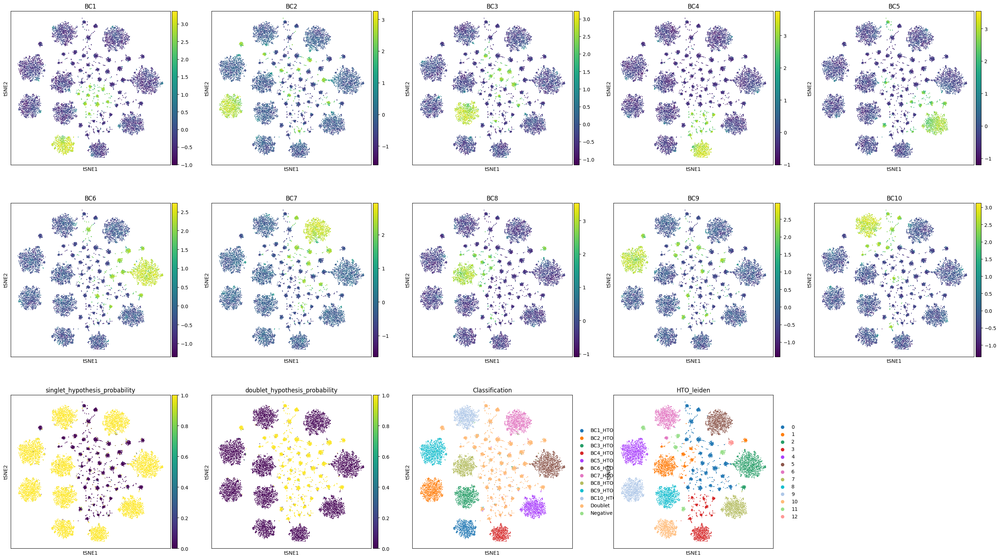

Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
computing PCA
    with n_comps=9
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 14 clusters and added
    'HTO_leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:30)


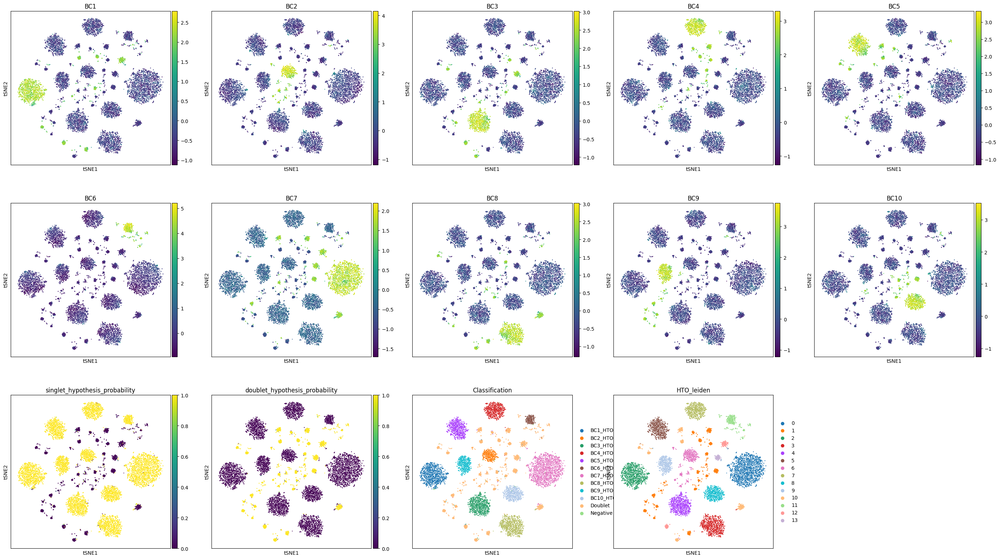

In [18]:
adatas_hashsolo = []

for i, adata in enumerate(adatas_HTO):
    HTO_data=adata.copy()
    HTO_data.layers["counts"] = HTO_data.X.copy()
    HTO_counts=pd.DataFrame(HTO_data.X.todense(), columns=HTO_data.var_names+'_HTO', index=HTO_data.obs_names)
    HTO_data.obs=pd.concat([HTO_data.obs,HTO_counts], axis=1)
    sc.external.pp.hashsolo(HTO_data,cell_hashing_columns=bc_m_HTO)
    
    adatas_hashsolo.append(HTO_data)

    clr_normalize_each_cell(HTO_data)
    sc.pp.log1p(HTO_data)
    sc.pp.scale(HTO_data)
    sc.pp.pca(HTO_data)
    sc.pp.neighbors(HTO_data, n_neighbors=50)
    sc.tl.leiden(HTO_data, key_added="HTO_leiden", resolution=.1)
    #sc.tl.umap(HTO_data)
    sc.tl.tsne(HTO_data)


    #sc.pl.umap(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification','HTO_leiden'], ncols=10, save='_HTO.pdf')
    sc.pl.tsne(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification','HTO_leiden'], ncols=5, save=str(adatas_HTO[i].obs.experiment[0])+'_HTO.pdf')
    #sc.pl.pca(HTO_data, color=HTO_data.var_names.tolist()+['singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification'], ncols=5, save=str(adatas_HTO_temp[i].obs.experiment[0])+'_HTO.pdf')

Apply barcode annotation to GEX adata and remove doublets/unidentified cells

In [19]:
for i, adata in enumerate(adatas_hashsolo):
    adatas[i].obs['single_bc']='None'
    adatas[i].obs.single_bc = adata.obs['Classification']
    
    adatas[i].obs['group_bc']='None'
    adatas[i].obs.group_bc = adata.obs['group_bc']

In [20]:
adatas_filtered = adatas.copy()
for i, adata in enumerate(adatas_filtered):
    adatas_filtered[i] = adata[adata.obs.group_bc.isin(bc_group)]
    
for i, adata in enumerate(adatas_filtered):
    adatas_filtered[i] = adata[adata.obs.single_bc.isin(bc_m_HTO)]

In [21]:
for i, adata in enumerate(adatas_filtered):
    print(str(adata.obs.experiment[0]) + ' n_obs before bc:' + str(adatas[i].n_obs) + ' || n_obs after bc:' + str(adata.n_obs))

1_dp_mult n_obs before bc:15756 || n_obs after bc:10069
2_dp_mult n_obs before bc:24921 || n_obs after bc:14510
3_dp_mult n_obs before bc:27945 || n_obs after bc:12347
4_dp_mult n_obs before bc:19414 || n_obs after bc:8955


Fraction of barcoded cells with singlet identification

In [22]:
for i, adata in enumerate(adatas_filtered):
    print(str(adata.obs.experiment[0]) + ': ' + str(adata.n_obs/adatas[i].n_obs*100))

1_dp_mult: 63.9058136582889
2_dp_mult: 58.223987801452594
3_dp_mult: 44.183217033458575
4_dp_mult: 46.1265066446894


## Annotation of mouse samples

Here we are removing the hashtag expression from the adata sets

In [23]:
for i, adata in enumerate(adatas_filtered):
    adatas_filtered[i]=adatas_filtered[i][:, ~adatas_filtered[i].var_names.isin(bc_all)].copy()

Annotation of experimental conditions

In [24]:
adatas_filtered[0].obs['multimer']='multimer_dp'
adatas_filtered[1].obs['multimer']='multimer_dp'
adatas_filtered[2].obs['multimer']='multimer_dp'
adatas_filtered[3].obs['multimer']='multimer_dp'

adatas_filtered[0].obs['batch']='unstim'
adatas_filtered[1].obs['batch']='unstim'
adatas_filtered[2].obs['batch']='unstim'
adatas_filtered[3].obs['batch']='unstim'

adatas_filtered[0].obs['exp_group']='1_dp_mult'
adatas_filtered[1].obs['exp_group']='2_dp_mult'
adatas_filtered[2].obs['exp_group']='3_dp_mult'
adatas_filtered[3].obs['exp_group']='4_dp_mult'


Read-in barcode annotation

In [25]:
hto_annotation_multimer = pd.read_csv(read_csv + 'dp_mult_annotation.csv')

In [26]:
hto_annotation_multimer['single_bc']= hto_annotation_multimer['single_bc'].map(str)
hto_annotation_multimer['group_bc']= hto_annotation_multimer['group_bc'].map(str)
hto_annotation_multimer['experiment']= hto_annotation_multimer['experiment'].map(str)
hto_annotation_multimer['mouse']= hto_annotation_multimer['mouse'].map(str)

In [27]:
bc_group = ['CD3', 'CD90']
bc_m = ['BC1','BC2','BC3','BC4','BC5','BC6','BC7','BC8','BC9','BC10']
bc_all = bc_group + bc_m
bc_m_HTO = []
for i in bc_m:
    bc_m_HTO.append(i + '_HTO')

In [28]:
for i, adata in enumerate(adatas_filtered):
    #create mouse column in obs
    adatas_filtered[i].obs['mouse']='None'
    #define experiment
    experiment = adata.obs.experiment[0]
    #look for group barcode
    group = 'CD3'
    for barcode in (bc_m_HTO):
        #get all cell ids that have group barcode and respective single barcode
        anot = adata.obs_names.values[np.logical_and(adata.obs.group_bc=='CD3',adata.obs.single_bc==barcode)]
        #look for mouse annotation in csv file that matches the defined barcodes and experiment
        mouse = hto_annotation_multimer.loc[((hto_annotation_multimer.single_bc==barcode) & (hto_annotation_multimer.experiment==experiment) & (hto_annotation_multimer.group_bc==group)),'mouse'].item()
        #writes mouse annotation into adata.obs.mouse
        adata.obs.loc[anot, 'mouse'] = mouse
        
    #the same for group barcode CD90
    experiment = adata.obs.experiment[0]
    group = 'CD90'
    for barcode in (bc_m_HTO):
        anot = adata.obs_names.values[np.logical_and(adata.obs.group_bc=='CD90',adata.obs.single_bc==barcode)]
        mouse = hto_annotation_multimer.loc[((hto_annotation_multimer.single_bc==barcode) & (hto_annotation_multimer.experiment==experiment) & (hto_annotation_multimer.group_bc==group)),'mouse'].item()
        adata.obs.loc[anot, 'mouse'] = mouse

Excludes all cells without a hashtag

In [29]:
for i, adata in enumerate(adatas_filtered):
    adatas_filtered[i] = adata[adata.obs.mouse!='None']

In [30]:
experiment_list = ['1_dp_mult','2_dp_mult','3_dp_mult','4_dp_mult']

In [33]:
adatas_filtered[0].obs.mouse

AAACCTGAGACACGAC-1    m54
AAACCTGAGATGCCAG-1    m49
AAACCTGAGCCGGTAA-1    m57
AAACCTGAGCTCCTTC-1    m43
AAACCTGAGCTGATAA-1    m52
                     ... 
TTTGTCATCCTGCCAT-1    m45
TTTGTCATCGGAAACG-1    m49
TTTGTCATCGTGGGAA-1    m46
TTTGTCATCTCTAGGA-1    m53
TTTGTCATCTGTGCAA-1    m58
Name: mouse, Length: 10069, dtype: object

## Quality control and save to file

Remove gene/mt outliers

In [34]:
from scipy.stats import median_abs_deviation

# Define the outlier function
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

# Assume adatas is your list of AnnData objects,
# out_prefix_list contains the corresponding output prefixes,
# and adata_directory is the directory path where the files should be saved.
for i, adata in enumerate(adatas_filtered):
    # Annotate mitochondrial, ribosomal, and hemoglobin genes
    adata.var["mt"] = adata.var_names.str.startswith("Mt-")
    adata.var["ribo"] = adata.var_names.str.startswith(("Rps", "Rpl"))
    adata.var["hb"] = adata.var_names.str.contains("^Hb[^(p)]")
    
    # Calculate quality control metrics
    sc.pp.calculate_qc_metrics(
        adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
    )
    
    # Identify outliers based on various QC metrics
    adata.obs["outlier"] = (
        is_outlier(adata, "log1p_total_counts", 5)
        | is_outlier(adata, "log1p_n_genes_by_counts", 5)
        | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
    )
    
    adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
        adata.obs["pct_counts_mt"] > 8
    )
    
    print(f"Total number of cells for dataset {i}: {adata.n_obs}")
    
    # Filter out the low-quality cells
    adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()
    
    print(f"Number of cells after filtering for dataset {i}: {adata.n_obs}")
    
    # Save the processed AnnData (and raw data) object with the corresponding prefix
    # save files
    adatas_filtered[i] = adata
    adata_file = experiment_list[i] + '_hash_solo.h5ad'
    adata.write(adata_directory + adata_file)

Total number of cells for dataset 0: 10069
Number of cells after filtering for dataset 0: 9773
Total number of cells for dataset 1: 14510
Number of cells after filtering for dataset 1: 14257
Total number of cells for dataset 2: 12347
Number of cells after filtering for dataset 2: 12041
Total number of cells for dataset 3: 8955
Number of cells after filtering for dataset 3: 8755


### Load R processed SoupX data

In [35]:
import anndata
import scipy

In [36]:
for i, (sample, adata) in enumerate(zip(experiment_list, adatas_filtered)):
    matrix_file = sample_directory + 'GEX/dp_mult/adjusted_counts/' + sample + '_adjusted_counts.mtx'
    genes_file = sample_directory + 'GEX/dp_mult/adjusted_counts/' + sample + '_genes.tsv'
    barcodes_file = sample_directory + 'GEX/dp_mult/adjusted_counts/' + sample + '_barcodes.tsv'

    # Load the adjusted matrix, gene names, and cell barcodes.
    adj_matrix = scipy.io.mmread(matrix_file).tocsr().transpose()
    genes = pd.read_csv(genes_file, header=None, sep="\t")[0].values
    barcodes = pd.read_csv(barcodes_file, header=None, sep="\t")[0].values
    
    # Create the adjusted AnnData object.
    adata_adj = anndata.AnnData(X=adj_matrix)
    adata_adj.var_names = genes
    adata_adj.obs_names = barcodes
    
    # Remove genes from adata that are not in adata_adj.
    missing_genes = [gene for gene in adata.var_names if gene not in adata_adj.var_names]
    adata = adata[:, ~adata.var_names.isin(missing_genes)]
    
    # Remove genes from adata_adj that are not in adata.
    missing_genes = [gene for gene in adata_adj.var_names if gene not in adata.var_names]
    adata_adj = adata_adj[:, ~adata_adj.var_names.isin(missing_genes)]
    
    # Ensure that the cells in adata_adj match those in adata.
    cell_barcodes = adata.obs.index.tolist()
    adata_adj = adata_adj[adata_adj.obs.index.isin(cell_barcodes)].copy()
    
    print(sample + ': ') 
    if list(adata.var_names) == list(adata_adj.var_names):
        print("Gene order correct.")
    else:
        print(sample + ": !!!!!!!!!!!!!!Gene order wrong.")
    
    # Now add the adjusted counts as a new layer in adata.
    adata.layers["counts"] = adata.X.copy()
    adata.X = adata_adj.X.copy()
    
    #### commong gene filter
    sc.pp.filter_genes(adata, min_cells=20)
    print(f"Number of genes after cell filter: {adata.n_vars}")

    #### Doublet detection
    sc.pp.scrublet(adata, batch_key="experiment")
    print(adata.obs['predicted_doublet'].value_counts())
    #####
    # Update the list with the new adata
    adatas_filtered[i] = adata

    adata_file = experiment_list[i] + '_SoupX.h5ad'
    adata.write(adata_directory + adata_file)

1_dp_mult: 
Gene order correct.
filtered out 20853 genes that are detected in less than 20 cells
Number of genes after cell filter: 11392
Running Scrublet
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.62
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 3.3%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.3%
    Scrublet finished (0:00:42)
predicted_doublet
False    9772
True        1
Name: count, dtype: int64
2_dp_mult: 
Gene order correct.
filtered out 20532 genes that are detected in less t